In [1]:
# import module
import tensorflow as tf
import numpy as np
import os
import io
import time

#Define Token
START_ID = 0 #시퀀스 시작 토큰 ID
PAD_ID = 1   #시퀀스 공백 토큰 ID
END_ID = 2   #시퀀스 종결 토큰 ID

#Parameter
#입력 최대 길이
ENC_MAX_STEP = 10
#Label 최대 길이
DATA_MAX_OUTPUT = 4

DATA_PATH = "./data/convex_hull_5_test.txt"
PREFIX = "thermo"
#Label + End Token 최대 길이 
DEC_MAX_STEP = DATA_MAX_OUTPUT + 1 #max output lengths

BATCH_SIZE = 32
EPOCHS = 100
UNITS = 256
LEARNING_RATE = 0.001
BEAM_WIDTH = 4
OUTPUT_STD = None
DROPOUT_RATE = 0.0
#graident Clipping 파라미터
CLIPPING_VALUE = None
TRAIN_DATA_RATIO = 0.9

# Pointer Network 모델 선언

In [2]:
import batcher
import attention_models
import pointer_network

PN = pointer_network.PointerNetwork(UNITS, BATCH_SIZE,
                    learning_rate=LEARNING_RATE,
                    output_std=0.1,
                    dropout_rate=DROPOUT_RATE)


checkpoint_dir = "./training_checkpoints/pn" + PREFIX
checkpoint_prefix = os.path.join(checkpoint_dir, "pn")
checkpoint = tf.train.Checkpoint(**PN.get_model())

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [3]:
import filter_utils

input_folder = "./image/"
output_folder = "./filtered_images/"

filter_utils.process_images(input_folder, output_folder)

dir_path = './filtered_images/'
filtered_image_names = filter_utils.get_filtered_image_names(dir_path)
print(filtered_image_names)

이미지 처리 완료
['0019', '0072', '0075', '0137', '0155', '0158', '0171', '0189', '0195', '0263', '0276', '0284', '0285', '0286', '0290', '0319', '0357', '0374', '0388', '0430', '0444', '0445', '0458', '0478', '0539', '0553', '0554', '0558', '0593', '0611', '0636', '0666', '0697', '0739', '0895', '0899', '0907', '0919', '0938', '0960', '1002', '1039', '1043', '1068', '1077', '1098', '1176', '1206', '1238', '1257', '1262', '1350', '1364', '1401', '1415', '1421', '1445', '1461', '1498', '1501', '1519', '1529', '1531', '1585', '1603', '1609', '1642', '1690', '1691', '1753', '1767', '1778', '1804', '1829', '1860', '1869', '1881', '1945', '1952', '1986', '2002', '2021', '2026', '2109', '2130', '2136', '2224', '2243', '2279', '2387', '2396', '2401', '2460', '2484', '2491', '2511', '2517', '2522', '2527', '2603', '2605', '2610', '2614', '2685', '2697', '2723', '2730', '2735', '2766', '2767', '2815', '2853', '2885', '2894', '2915', '2935', '2960', '2971', '2988', '3010', '3024', '3025', '3089', '3128

In [4]:
import data_preprocessing

dir_path = './filtered_images/'
file_list = [file_name for file_name in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, file_name))]

dataname = []
for file_name in file_list:
    data_name, extension = os.path.splitext(file_name)
    dataname.append(data_name)

print("데이터 크기 : ", len(dataname))
img_folder = "./filtered_images/"
json_folder = "./221204/"

#이미지 전처리
data_x, original_imgs = data_preprocessing.preprocess_images(dataname, img_folder, json_folder)

#Label 생성
data_y = data_preprocessing.generate_labels(dataname)

# 결과 확인
for i in range(2):
    print(f"data_x[{i}].shape:", data_x[i].shape)  # (버튼 개수, 높이, 너비, 채널)
    print(f"data_y[{i}]:", data_y[i])


데이터 크기 :  194
data_x[0].shape: (10, 40, 50, 1)
data_y[0]: [ 1  1  2 10  0]
data_x[1].shape: (10, 40, 50, 1)
data_y[1]: [1 1 8 3 0]


In [5]:
import data_splitter



# 데이터 분리
train_inputs, train_labels, train_orig, val_inputs, val_labels, val_orig = data_splitter.split_train_val(data_x, 
                                                                                                         data_y, 
                                                                                                         original_imgs, 
                                                                                                         val_size=len(data_x)//10)



print(train_inputs.shape)
print(train_labels.shape)
print(val_inputs.shape)
print(val_labels.shape)

STEPS_PER_EPOCH = train_inputs.shape[0] // BATCH_SIZE
print(STEPS_PER_EPOCH)

(175, 10, 40, 50, 1)
(175, 5)
(19, 10, 40, 50, 1)
(19, 5)
5


In [ ]:
'''
# 데이터 증강
import augment_images

shifts = [(0, 0),
         (2, 2), (2, -2), (-2, 2), (-2, -2),
         (8, 0), (8, 0), (0, 8), (0, -8),
         (4, 4), (4, -4), (-4, 4), (-4, -4),
         (12, 0), (-12, 0), (0, 12), (0, -12)]

rotates = [0, 2, -2, 5, -5, 10, -10, 15, -15]

cut = np.zeros(len(data_x), dtype=bool)

train_inputs, train_labels = augment_images.augment_images(dataname, file_list, cut, shifts, rotates)
train_orig = original_imgs

train_inputs = np.expand_dims(train_inputs, axis=-1)  # grayscale 이미지라 channel이 1이니까 확장해줌
print(train_inputs.shape)
print(train_labels.shape)
'''

In [6]:
import batcher
import attention_models
import pointer_network


In [7]:
#확인용

train_batcher = batcher.Batcher(train_inputs, train_labels, randomize=True)

inp, targ = train_batcher.get_batch(32)

print(inp.shape)
print(targ.shape)

train_batcher.reset_random()

print(train_inputs.shape)
print(train_labels.shape)

print(val_inputs.shape)
print(val_labels.shape)

(32, 10, 40, 50, 1)
(32, 5)
(175, 10, 40, 50, 1)
(175, 5)
(19, 10, 40, 50, 1)
(19, 5)


# 학습된 데이터를 기반으로 비밀번호 예측해보기
# YOLOv5로 객체 탐지 - PN 모델로 비밀번호 예측 순
# PN 선언하고 돌려야 합니다.

In [5]:
import predict_password as pp #predict_password 모듈 임포트
import numpy as np

#input image 설정 
input_image = '5350.jpg'

#label의 위치 추출 (type : dataframe), YOLOv5 모델 불러오기 
#YOLOv5 모델은 predict_password.py에 경로가 적혀있음
password_results_df = pp.extract_password_label(input_image) 

# label에 해당하는 부분을 자르고, 150x200 크기로 리사이징
cropped_image = pp.cropping_image(input_image, password_results_df) 

#test_data에 0부터 9까지의 키패드 이미지를 넣음
test_data = pp.preprocess_evaluating_image(cropped_image) 
test_data = np.expand_dims(test_data, axis=0) #encoder의 입력 layer에 맞춰줌


inp, targ = test_data, np.zeros((test_data.shape[0],DEC_MAX_STEP), dtype=np.int32) #targ에는 dummy값을 넣어줌 (정답이 없는 이미지이기 때문)
#포인터 네트워크 모델로 예측 수행
result = PN.predict(inp, targ) 
predictions = result[0] 
password_prediction = (predictions.numpy().squeeze()[:-1] - 1).tolist()  #종결토큰무시
password_string = ''.join(map(str, password_prediction))
print(predictions)

#password_string이 예측 비밀번호임
print("비밀번호 예측값:", password_string) 




Using cache found in C:\Users\yongg/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-3-24 Python-3.9.16 torch-2.0.0+cpu CPU

Fusing layers... 
Model summary: 166 layers, 7056607 parameters, 0 gradients
Adding AutoShape... 


tf.Tensor(
[[[6]
  [4]
  [6]
  [1]
  [0]]], shape=(1, 5, 1), dtype=int64)
비밀번호 예측값: 5350




### 인코더와 디코더는 기본적으로 LSTM 모델을 사용한다.

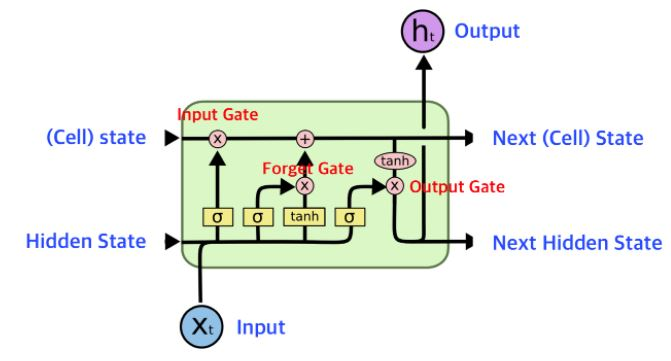

LSTM은 h와 c 두 개의 은닉 상태를 가진다.
* h: 단기 기억(이자 출력)
* c: 장기 기억


# Pointer Network 및 체크포인트 선언, 학습된 값 복원, 실험 코드

In [ ]:
'''
PN = pointer_network.PointerNetwork(UNITS, BATCH_SIZE,
                    learning_rate=LEARNING_RATE,
                    output_std=0.1,
                    dropout_rate=DROPOUT_RATE)


checkpoint_dir = "./training_checkpoints/pn" + PREFIX
checkpoint_prefix = os.path.join(checkpoint_dir, "pn")
checkpoint = tf.train.Checkpoint(**PN.get_model())

checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

#val_labels = np.expand_dims(val_labels, axis=-1)  # 차원 추가
#val_labels = np.tile(val_labels, [1, 10, 1])  # (18, 10, 1)로 변환
(predictions, acc) =  PN.eval(val_inputs[:1], val_labels[:1])
'''

print("예측 id: ")
for i in range( predictions.shape[1]):
    print(predictions[0,i,0].numpy(), "", end="")
print()
print("정답 id: ")
for i in range(val_labels.shape[1]):
    print(val_labels[0,i], "", end="")

In [8]:
print(train_inputs.shape)
print(train_labels.shape)

print(val_inputs.shape)
print(val_labels.shape)

(175, 10, 40, 50, 1)
(175, 5)
(19, 10, 40, 50, 1)
(19, 5)


# 검증 코드

In [9]:
import matplotlib.pyplot as plt

def array_similarity(arr1, arr2): ## 배열 유사도
    assert len(arr1) == len(arr2)

    match_count = 0
    length = len(arr1)
    for i in range(length):
        if arr1[i] == arr2[i]:
            match_count += 1

    return match_count / length

def jaccard_similarity(arr1, arr2):
    set1 = set([x for x in arr1 if x != -1])
    set2 = set([x for x in arr2 if x != -1])

    intersection = set1.intersection(set2)
    union = set1.union(set2)

    if not union:
        return 1.0

    return len(intersection) / len(union)


def validation_print(k=3, N=1, show_img=False):
    acc = 0.0
    total_similarity = 0.0

    inp, lab = val_inputs, val_labels

    for n_samples in range(N):
        result, n_samples = PN.eval(inp, lab)
        #top_k_probs, top_k_indices = top_k_predictions(PN, inp, k=k)
        acc += n_samples
    
        acc = acc / N
        print("Evaluation: ")
        print("acc: ", acc)

        for i in range(val_inputs.shape[0]):
            pred_arr = [result[i, j, 0].numpy() - 1 for j in range(result.shape[1])]
            targ_arr = [lab[i, j] - 1 for j in range(DEC_MAX_STEP)]

            similarity = jaccard_similarity(pred_arr, targ_arr)
            total_similarity += similarity


            if show_img:
                plt.imshow(val_orig[i])
                plt.show()

            print("=====================sample {0}=====================".format(i + 1))

            r_str = "pred: [{}]".format(" ".join("{:^3}".format(x) for x in pred_arr))
            t_str = "targ: [{}]".format(" ".join("{:^3}".format(x) for x in targ_arr))
            s_str = "배열 유사도: {:.2f}".format(similarity)


            print(r_str)
            print(t_str)
            print(s_str)

            

    avg_similarity = total_similarity / (val_inputs.shape[0] * N)
    #acc = acc / (val_inputs.shape[0] * N)

    #print("\nacc: ", acc)
    print("배열 유사도 평균치: {:.2f}".format(avg_similarity))
    print("----------------------------------")

    return acc


## 검증

Evaluation: 
acc:  0.05263157894736842


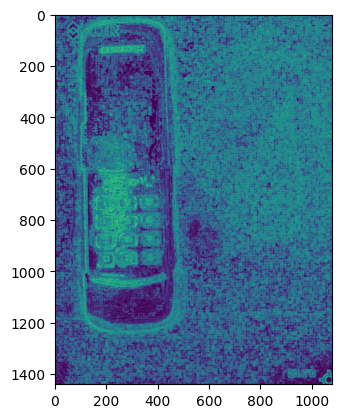

=====================sample 1=====================
pred: [ 4   4   0   7  -1 ]
targ: [ 0   0   7   2  -1 ]
배열 유사도: 0.50


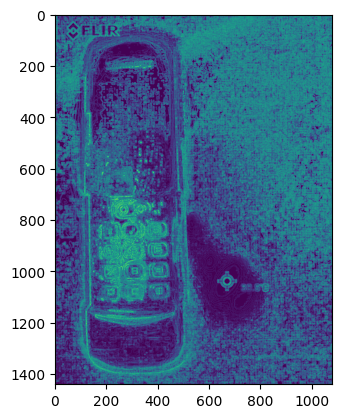

=====================sample 2=====================
pred: [ 8   8   0   8  -1 ]
targ: [ 0   3   8   8  -1 ]
배열 유사도: 0.67


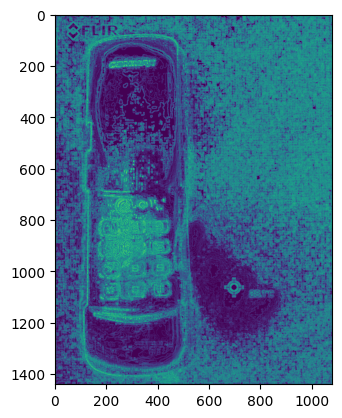

=====================sample 3=====================
pred: [ 9   9   1   3  -1 ]
targ: [ 0   9   3   8  -1 ]
배열 유사도: 0.40


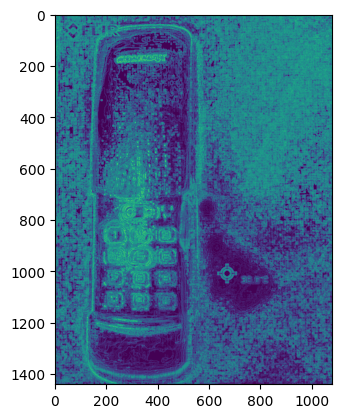

=====================sample 4=====================
pred: [ 1   5   1   4  -1 ]
targ: [ 1   4   1   5  -1 ]
배열 유사도: 1.00


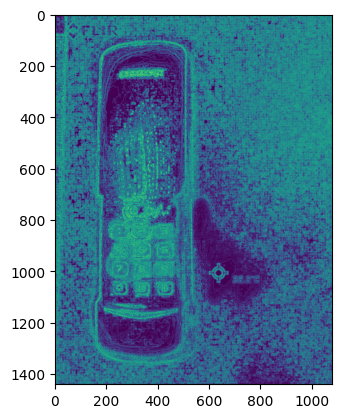

=====================sample 5=====================
pred: [ 1   7   8   7  -1 ]
targ: [ 1   7   6   7  -1 ]
배열 유사도: 0.50


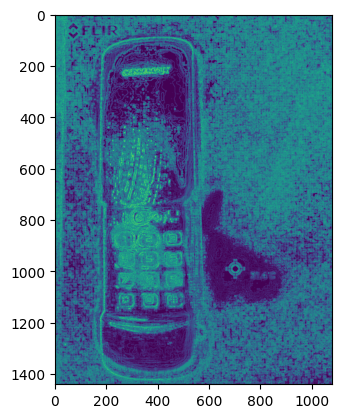

=====================sample 6=====================
pred: [ 1   5   9   4  -1 ]
targ: [ 1   9   5   2  -1 ]
배열 유사도: 0.60


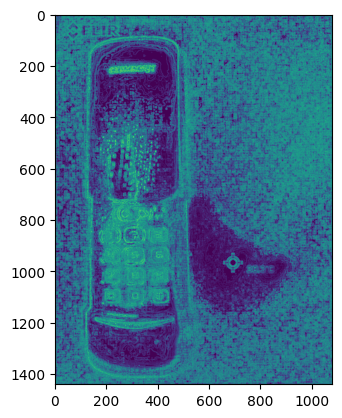

=====================sample 7=====================
pred: [ 2   2   0   2  -1 ]
targ: [ 2   0   2   6  -1 ]
배열 유사도: 0.67


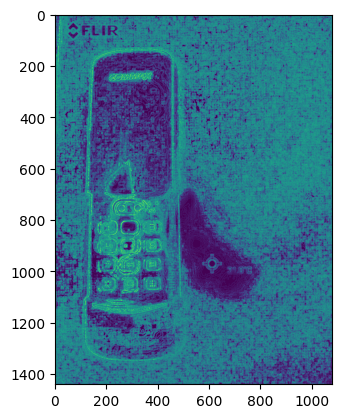

=====================sample 8=====================
pred: [ 2   2   1   4  -1 ]
targ: [ 2   2   2   4  -1 ]
배열 유사도: 0.67


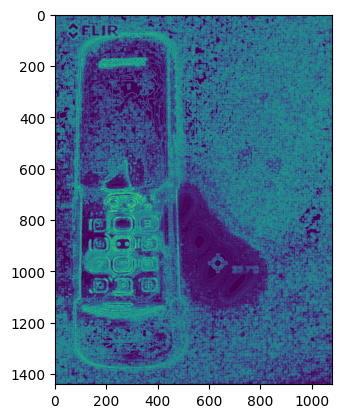

=====================sample 9=====================
pred: [ 3   2   8   7  -1 ]
targ: [ 2   3   8   7  -1 ]
배열 유사도: 1.00


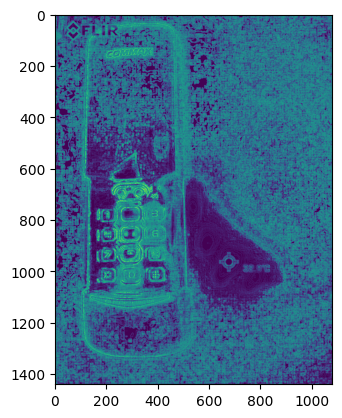

=====================sample 10=====================
pred: [ 2   5   6   2  -1 ]
targ: [ 2   6   0   3  -1 ]
배열 유사도: 0.40


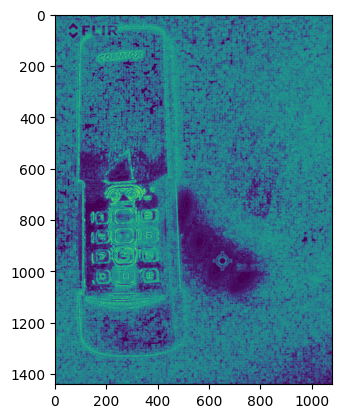

=====================sample 11=====================
pred: [ 2   2   8   6  -1 ]
targ: [ 2   6   0   5  -1 ]
배열 유사도: 0.40


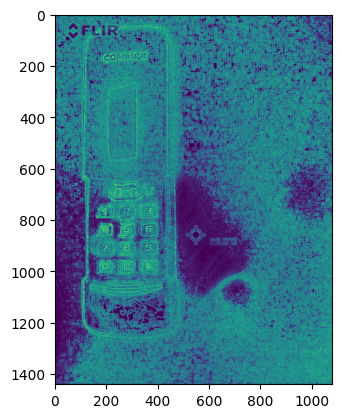

=====================sample 12=====================
pred: [ 7   7   2   2  -1 ]
targ: [ 2   6   9   7  -1 ]
배열 유사도: 0.50


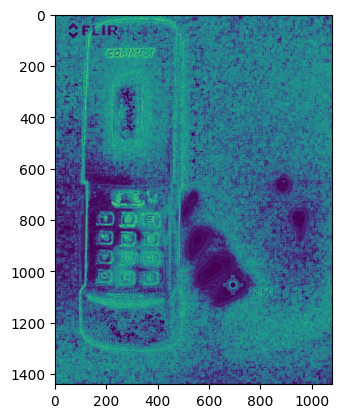

=====================sample 13=====================
pred: [ 3   0   8   8  -1 ]
targ: [ 3   0   8   9  -1 ]
배열 유사도: 0.75


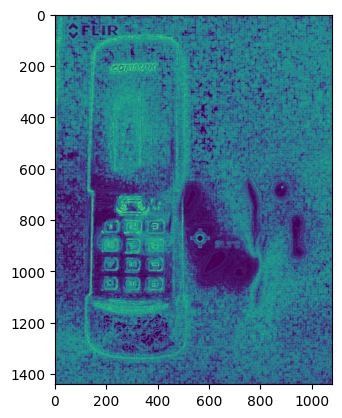

=====================sample 14=====================
pred: [ 3   4   3   4  -1 ]
targ: [ 3   2   6   4  -1 ]
배열 유사도: 0.50


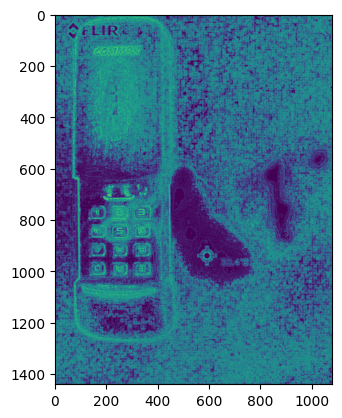

=====================sample 15=====================
pred: [ 3   5   2   5  -1 ]
targ: [ 3   5   2   5  -1 ]
배열 유사도: 1.00


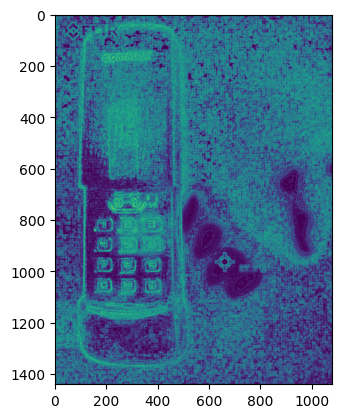

=====================sample 16=====================
pred: [ 3   6   5   6  -1 ]
targ: [ 3   6   2   5  -1 ]
배열 유사도: 0.75


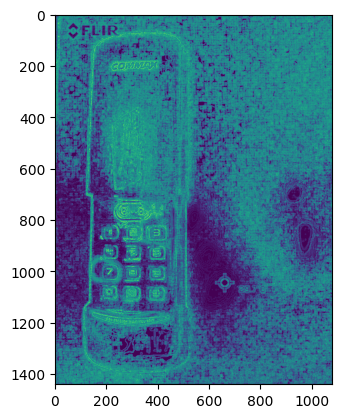

=====================sample 17=====================
pred: [ 3   0   7   0  -1 ]
targ: [ 3   7   7   7  -1 ]
배열 유사도: 0.67


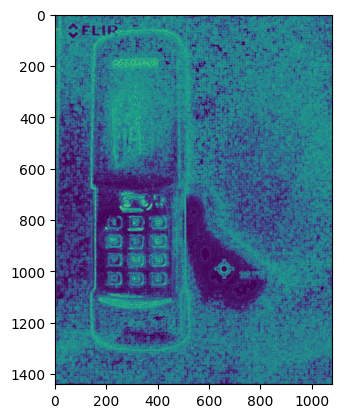

=====================sample 18=====================
pred: [-1  -1  -1  -1  -1 ]
targ: [ 4   8   9   6  -1 ]
배열 유사도: 0.00


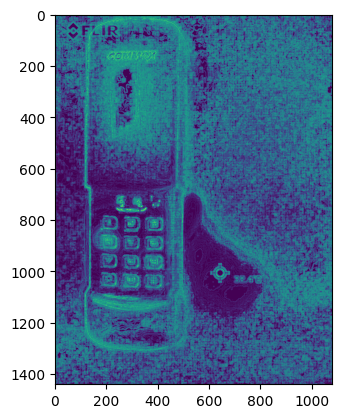

=====================sample 19=====================
pred: [ 0   4   0   4  -1 ]
targ: [ 4   9   4   0  -1 ]
배열 유사도: 0.67
배열 유사도 평균치: 0.61
----------------------------------


0.05263157894736842

In [10]:
validation_print(show_img=True)

In [11]:
#학습하기
for epoch in range(100):
    start = time.time()
    total_loss = 0
    rand_idx = np.arange(train_inputs.shape[0])

    np.random.shuffle(rand_idx)
    
    for batch in range(STEPS_PER_EPOCH):
      
        inp, targ = train_batcher.get_batch(BATCH_SIZE)

        batch_loss = PN.step(inp, targ, clipping_value = CLIPPING_VALUE)
        total_loss += batch_loss

        if batch % 100 == 0:
            print('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1,
                                                         batch,
                                                             batch_loss.numpy()))
        #if batch % 1000 == 0:
    #if (epoch+1)%10 == 0:
      #validation_print()

    # saving (checkpoint) the model every 2 epochs
    checkpoint.save(file_prefix = checkpoint_prefix)

    print('Epoch {} Loss {:.4f}'.format(epoch + 1,
                                        total_loss/ STEPS_PER_EPOCH))
    print('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    

Epoch 1 Batch 0 Loss 3.5006
Epoch 1 Loss 4.4690
Time taken for 1 epoch 6.398336172103882 sec

Epoch 2 Batch 0 Loss 2.1598
Epoch 2 Loss 2.1101
Time taken for 1 epoch 0.39461374282836914 sec

Epoch 3 Batch 0 Loss 1.6350
Epoch 3 Loss 1.6514
Time taken for 1 epoch 0.395491361618042 sec

Epoch 4 Batch 0 Loss 1.6838
Epoch 4 Loss 1.6446
Time taken for 1 epoch 0.39305830001831055 sec

Epoch 5 Batch 0 Loss 1.5944
Epoch 5 Loss 1.6354
Time taken for 1 epoch 0.39226484298706055 sec

Epoch 6 Batch 0 Loss 1.6006
Epoch 6 Loss 1.6323
Time taken for 1 epoch 0.3820490837097168 sec

Epoch 7 Batch 0 Loss 1.4971
Epoch 7 Loss 1.5975
Time taken for 1 epoch 0.395829439163208 sec

Epoch 8 Batch 0 Loss 1.6165
Epoch 8 Loss 1.6241
Time taken for 1 epoch 0.3869950771331787 sec

Epoch 9 Batch 0 Loss 1.6163
Epoch 9 Loss 1.5750
Time taken for 1 epoch 0.3920435905456543 sec

Epoch 10 Batch 0 Loss 1.6698
Epoch 10 Loss 1.6029
Time taken for 1 epoch 0.40950632095336914 sec

Epoch 11 Batch 0 Loss 1.5297
Epoch 11 Loss 1.56

Epoch 86 Loss 0.7162
Time taken for 1 epoch 0.3604097366333008 sec

Epoch 87 Batch 0 Loss 0.7401
Epoch 87 Loss 0.7344
Time taken for 1 epoch 0.3681297302246094 sec

Epoch 88 Batch 0 Loss 0.7087
Epoch 88 Loss 0.7133
Time taken for 1 epoch 0.3583085536956787 sec

Epoch 89 Batch 0 Loss 0.7434
Epoch 89 Loss 0.7249
Time taken for 1 epoch 0.3577854633331299 sec

Epoch 90 Batch 0 Loss 0.6864
Epoch 90 Loss 0.6670
Time taken for 1 epoch 0.35851168632507324 sec

Epoch 91 Batch 0 Loss 0.7486
Epoch 91 Loss 0.7002
Time taken for 1 epoch 0.367567777633667 sec

Epoch 92 Batch 0 Loss 0.5993
Epoch 92 Loss 0.6478
Time taken for 1 epoch 0.3677804470062256 sec

Epoch 93 Batch 0 Loss 0.6126
Epoch 93 Loss 0.6640
Time taken for 1 epoch 0.36418747901916504 sec

Epoch 94 Batch 0 Loss 0.6651
Epoch 94 Loss 0.6735
Time taken for 1 epoch 0.3685901165008545 sec

Epoch 95 Batch 0 Loss 0.7228
Epoch 95 Loss 0.6442
Time taken for 1 epoch 0.39306211471557617 sec

Epoch 96 Batch 0 Loss 0.6259
Epoch 96 Loss 0.6019
Time ta

Evaluation: 
acc:  0.05263157894736842


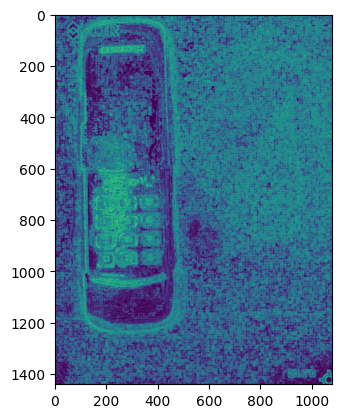

=====================sample 1=====================
pred: [ 0   7   8   7  -1 ]
targ: [ 0   0   7   2  -1 ]
배열 유사도: 0.50


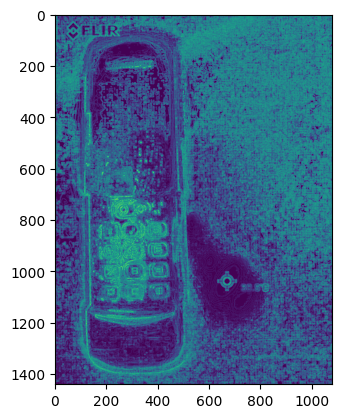

=====================sample 2=====================
pred: [ 0   8   8   8  -1 ]
targ: [ 0   3   8   8  -1 ]
배열 유사도: 0.67


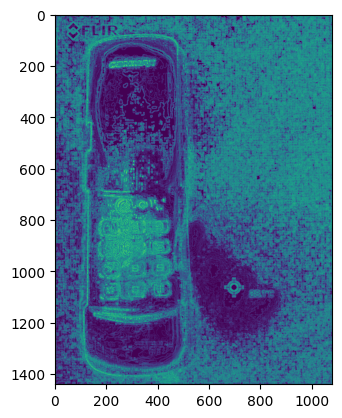

=====================sample 3=====================
pred: [ 0   8   8   8  -1 ]
targ: [ 0   9   3   8  -1 ]
배열 유사도: 0.50


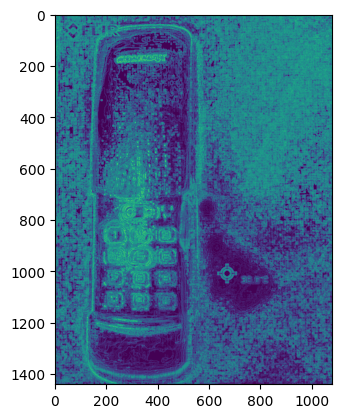

=====================sample 4=====================
pred: [ 1   5   1   5  -1 ]
targ: [ 1   4   1   5  -1 ]
배열 유사도: 0.67


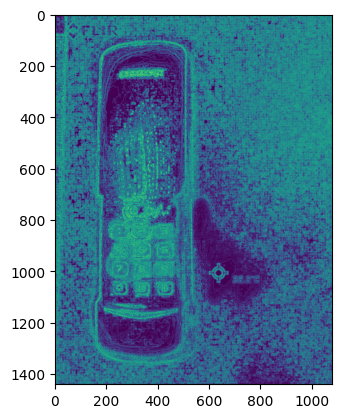

=====================sample 5=====================
pred: [ 1   7   7   0  -1 ]
targ: [ 1   7   6   7  -1 ]
배열 유사도: 0.50


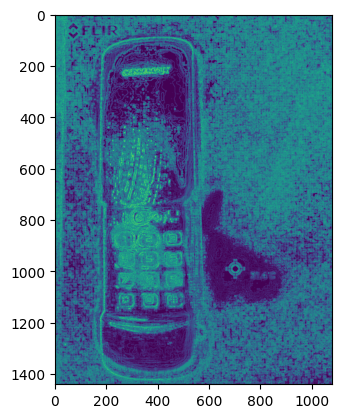

=====================sample 6=====================
pred: [ 1   9   5   9  -1 ]
targ: [ 1   9   5   2  -1 ]
배열 유사도: 0.75


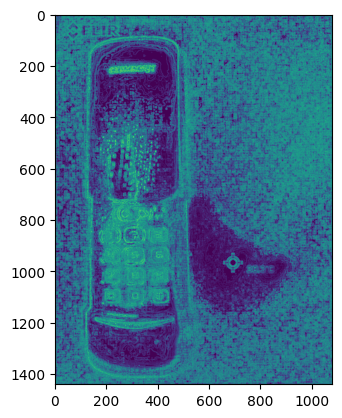

=====================sample 7=====================
pred: [ 2   8   0   0  -1 ]
targ: [ 2   0   2   6  -1 ]
배열 유사도: 0.50


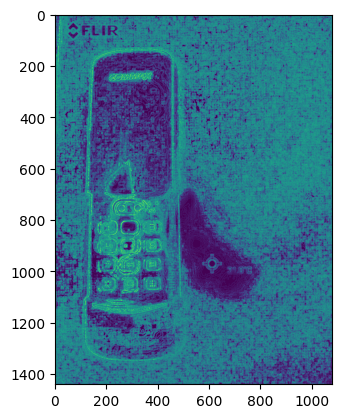

=====================sample 8=====================
pred: [ 2   2   4   2   1 ]
targ: [ 2   2   2   4  -1 ]
배열 유사도: 0.67


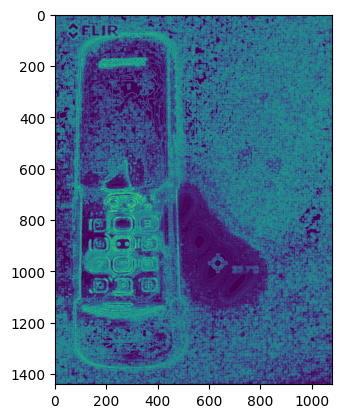

=====================sample 9=====================
pred: [ 2   7   2   2  -1 ]
targ: [ 2   3   8   7  -1 ]
배열 유사도: 0.50


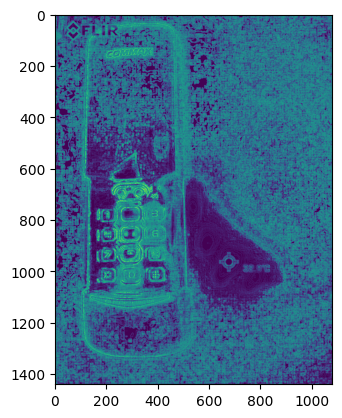

=====================sample 10=====================
pred: [ 2   9   3   0  -1 ]
targ: [ 2   6   0   3  -1 ]
배열 유사도: 0.60


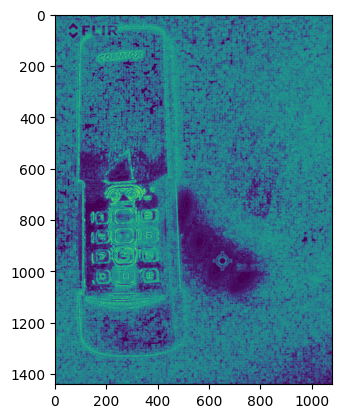

=====================sample 11=====================
pred: [ 2   0   0   0  -1 ]
targ: [ 2   6   0   5  -1 ]
배열 유사도: 0.50


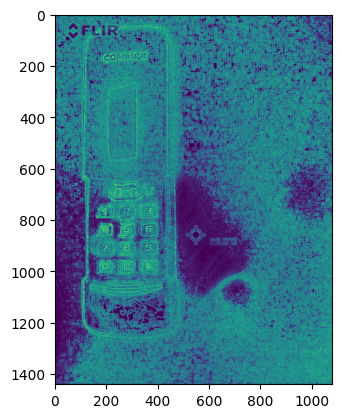

=====================sample 12=====================
pred: [ 2   7   6   7  -1 ]
targ: [ 2   6   9   7  -1 ]
배열 유사도: 0.75


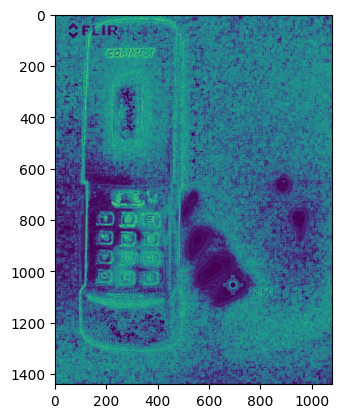

=====================sample 13=====================
pred: [ 3   0   0   9  -1 ]
targ: [ 3   0   8   9  -1 ]
배열 유사도: 0.75


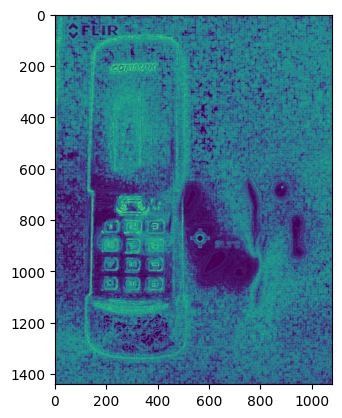

=====================sample 14=====================
pred: [ 3   3   3   3  -1 ]
targ: [ 3   2   6   4  -1 ]
배열 유사도: 0.25


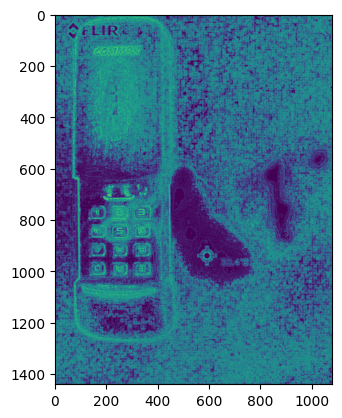

=====================sample 15=====================
pred: [ 3   5   2   2  -1 ]
targ: [ 3   5   2   5  -1 ]
배열 유사도: 1.00


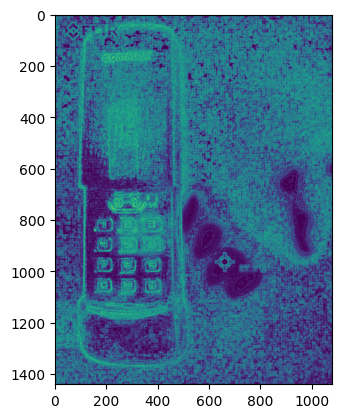

=====================sample 16=====================
pred: [ 3   3   5   3  -1 ]
targ: [ 3   6   2   5  -1 ]
배열 유사도: 0.50


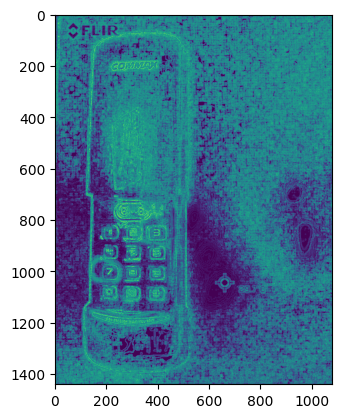

=====================sample 17=====================
pred: [ 3   7   7   7  -1 ]
targ: [ 3   7   7   7  -1 ]
배열 유사도: 1.00


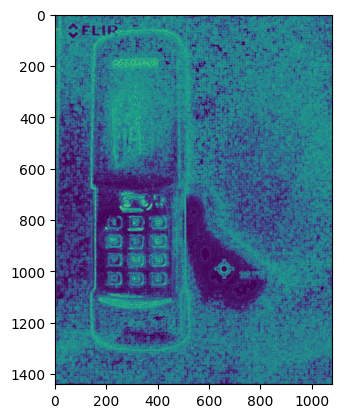

=====================sample 18=====================
pred: [ 4   4   8   8  -1 ]
targ: [ 4   8   9   6  -1 ]
배열 유사도: 0.50


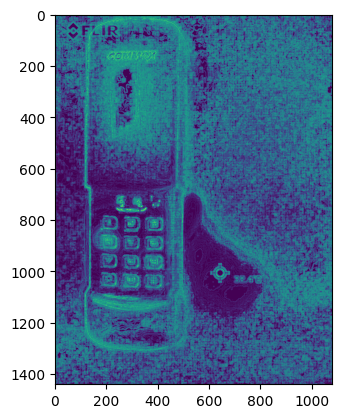

=====================sample 19=====================
pred: [ 4   4   9   0  -1 ]
targ: [ 4   9   4   0  -1 ]
배열 유사도: 1.00
배열 유사도 평균치: 0.64
----------------------------------


0.05263157894736842

In [12]:
#검증
validation_print(show_img=True)

# Convex hull 그리기

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from scipy.spatial import ConvexHull

def plot_convex_hull(inp, targ, pred):
    # plot input points
    fig = plt.figure(figsize=(12, 6))
    ax = plt.subplot(1, 2, 1)
    plt.scatter(inp[:, 0], inp[:, 1])
    
    # plot convex hull of target points
    ax = plt.subplot(1, 2, 2)
    plt.scatter(inp[:, 0], inp[:, 1])
    hull = ConvexHull(inp[np.squeeze(targ[i].astype(bool))])
    hull = ConvexHull(np.unique(inp[np.squeeze(targ[i].astype(bool))], axis=0))
    for simplex in hull.simplices:
        plt.plot(inp[np.squeeze(targ.astype(bool))][simplex, 0], inp[np.squeeze(targ.astype(bool))][simplex, 1], 'r-')
    plt.show()

# draw convex hulld
print(val_labels.shape)
n_samples = 10
predictions, _ = PN.eval(tf.constant(val_inputs[:n_samples]), tf.constant(val_labels[:n_samples], dtype=tf.int64))
# 또는


for i in range(n_samples):
    # Reshape the inputs and labels using np.reshape and convert to numpy arrays
    val_input_2D = np.array(val_inputs[i]).reshape(-1, 2)
    val_label_2D = np.array(val_labels[i]).reshape(-1)
    prediction_2D = np.array(predictions[i]).reshape(-1)
    plot_convex_hull(val_input_2D, val_label_2D, prediction_2D)
